# Instalación de librerias

In [ ]:
!pip install vtk
!pip install itk

from matplotlib import pyplot as plt
import itk
import vtk
import numpy as np
import skimage
import scipy
from skimage import morphology
from PIL import Image
import statistics
from matplotlib.patches import Circle
from openpyxl import Workbook
from openpyxl.styles import Alignment
import cv2 
from google.colab.patches import cv2_imshow

# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

     |████████████████████████████████| 48.9MB 89kB/s 
     |████████████████████████████████| 11.1MB 80.8MB/s 
     |████████████████████████████████| 37.5MB 87kB/s 
     |████████████████████████████████| 8.1MB 43.3MB/s 
     |████████████████████████████████| 26.6MB 41.6MB/s 
     |████████████████████████████████| 54.7MB 77kB/s 
     |████████████████████████████████| 11.0MB 48.6MB/s 
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


# Función analisis

Inputs: path, número de imagen inicial, número de imagen final

In [ ]:
def analisis(adress,coleccion,start,end):
  pathMask ='/content/drive/My Drive/CNEA/STREPTAVIDINA/imageMask/blackmask.tif'
  maskImage=cv2.imread(pathMask)
  imagenes=[]
  arrays=[]
  luminancias=[]
  #Se calcula el Umbral general de la coleccion de imagenes
  Umbral=UmbralGeneral(adress,start,end)
  #Se arma el excel
  workbook = Workbook()
  worksheet = workbook.active

  for i in range(start,end+1):
    #Se arma el directorio de cada imagen
    path=adress+'Image'+ str(i) +'.tif'

    #Se obtiene la imagen y se la transforma a un array
    #imagenes: se guardan todas las imagenes de esta coleccion (start,end)
    #arrays: se guardan todas las imagenes transformadas a array
    imagenes.append(itk.imread(path))
    arrays.append(itk.GetArrayFromImage(imagenes[i-start]))

    #filas, columnas de la imagen y sus capas RGB
    filas=arrays[i-start].shape[0]
    columnas=arrays[i-start].shape[1]
    R=arrays[i-start][:,:,0]
    G=arrays[i-start][:,:,1]
    B=arrays[i-start][:,:,2]

    #Array que va a guardar todas las luminancias de una imagen que superen el Umbral definido
    ImagenL=[]

    #Recorre por cada fila todas las columnas (recorre todos los pixeles)
    for f in range(filas):
      for c in range(columnas):
        #Si los pixeles no estan situados en la zona central del error de la lente realiza la acción
        if(maskImage[f][c][0] == 0.):
          #Calcula la luminancia de cada pixel
          lum=0.2126*R[f][c]+0.7152*G[f][c]+0.0722*B[f][c]

          #Si supera el Umbral el valor de luminancia (lum)
          if (lum >= Umbral):
            ImagenL.append(lum)

            #Variantes para el calculo de luminancia

            #Luminance1 = 0.27 red + 0.67 green + 0.06 blue
            #L2=(0.2126*R + 0.7152*G + 0.0722*B)
            #lum=0.2126*R[f][c]+0.7152*G[f][c]+0.0722*B[f][c]

    worksheet['B'+str(i-start+2)]='Image '+ str(i)
    # % de Luminicencia
    print('% de Luminicencia: ' + str(100*len(ImagenL)/(filas*columnas)))
    
    worksheet['C'+str(i-start+2)]=str(100*len(ImagenL)/(filas*columnas))
    # Max de Luminicencia
    print('Max '+ str(max(ImagenL)))
       
    worksheet['D'+str(i-start+2)]=str(max(ImagenL))
    # Min de Luminicencia
    print('Min '+ str(min(ImagenL)))                           
    
    worksheet['E'+str(i-start+2)]=str(min(ImagenL))
    # Median de Luminicencia
    print('Median ' + str((statistics.median(ImagenL))))
    
    worksheet['F'+str(i-start+2)]=str((statistics.median(ImagenL)))
    # Bins Luminancia >= Umbral
    print('Bins Luminancia: '+str(len(ImagenL)))
    
    worksheet['G'+str(i-start+2)]=str(len(ImagenL))
    # Umbral
    print('Lum >' + str(Umbral) )
    
    worksheet['H'+str(i-start+2)]=str(Umbral)
    #Tamaño imagen
    print('filas: '+ str(filas), 'columnas: '+ str(columnas))
          
    # luminancias: por imagen guarda el conjunto de luminancias que superaron el umbral
    luminancias.append(ImagenL)
    #Muestra Imagen
    print('Image '+ str(i))     
    plt.imshow(arrays[i-start])
    plt.show()
    # Nombre Imagen
    
    
    
    
    #Plot Luminicencias
    plt.title('Luminicencias de Imagen')
    plt.plot(ImagenL)
    plt.show()
  worksheet['A1']='Colección'
  worksheet['B1']='Imagenes'
  worksheet['C1']='% Luminicencia'
  worksheet['D1']='Max L' 
  worksheet['E1']='Min L'
  worksheet['F1']='Mediana L'
  worksheet['G1']='Bins L > Umbral'
  worksheet['H1']='Umbral L'
  worksheet.merge_cells('A2:A'+str(i-start+2))
  worksheet['A2']=coleccion
  workbook.save(coleccion+'.xlsx')


# Función CalculoUmbral: umbral por imagen


1.   Se calcula la luminancia de todos los pixeles que no pertenezcan a la zona central donde se encuentra el error de la lente del microscopio.
2.   Se crea un array con los valores unicos de luminancia de toda la imagen 
3.   Se calcula la mediana de ese array, valor que se considera el umbral

In [ ]:
def CalculoUmbralPorImagen(path):
  pathMask ='/content/drive/My Drive/CNEA/STREPTAVIDINA/imageMask/blackmask.tif'
  maskImage=cv2.imread(pathMask)
  imagen=itk.imread(path)
  array=itk.GetArrayFromImage(imagen)
  filas=array.shape[0]
  columnas=array.shape[1]
  L=[]
  R=array[:,:,0]
  G=array[:,:,1]
  B=array[:,:,2]
  for f in range(filas):
    for c in range(columnas):
      if(maskImage[f][c][0] == 0.):
        lum=0.2126*R[f][c]+0.7152*G[f][c]+0.0722*B[f][c]
        if (lum not in L):
          L.append(lum)
  Umbral=statistics.median(L)
  return Umbral

# Funcion Umbral general
Toma la direccion de la carpeta de un grupo de imagenes. Inicio y fin son los numeros de fotos que contenga la carpeta. Devuelve un umbral general de todas las imagenes.

In [ ]:
def UmbralGeneral(adress,start,end):
  umbrales=[]
  for i in range(start,end+1):
    iteration=str(i)
    path=adress+'Image'+ iteration +'.tif'
    u=CalculoUmbralPorImagen(path)
    umbrales.append(u)
  Umbral=statistics.mean(umbrales)
  return Umbral

# Generación y guardado de máscara para la corrección del error de la lente

In [ ]:
pathTest ='/content/drive/My Drive/CNEA/STREPTAVIDINA/7-2 SiO2/Image53.tif'
image = cv2.imread(pathTest) 
# generates a black image with the shape of the original image
black = np.zeros_like(image)
window_name = 'Image'
#circle
center_coordinates = (700, 570) 
radius = 300
color = (255, 255,255)
thickness = -1
#add circle to black mask
blackMask = cv2.circle(black, center_coordinates, radius, color, thickness)
# sabe the mask
cv2.imwrite('blackMask.png',black)

TypeError: ignored

# Prueba para no tener en cuenta los pixeles de la zona del error del microscopio

In [ ]:
pathMask ='/content/drive/My Drive/CNEA/STREPTAVIDINA/imageMask/blackmask.tif'
pathImage ='/content/drive/My Drive/CNEA/STREPTAVIDINA/7-2 SiO2/Image53.tif'
#reads mask and image
maskImage=cv2.imread(pathMask)
imagen=cv2.imread(pathImage)
#arrays from images
# # arrayMask = itk.GetArrayFromImage(maskImage)
# # array=itk.GetArrayFromImage(imagen)
#output image = same shape as input image with erase pixels
outputimage=np.ones_like(imagen)

columnas = array.shape[1]
filas = array.shape[0]

for f in range(filas):
  for c in range(columnas):
    if(maskImage[f][c][0] == 0.):
      pixelesFondo += 1
      outputimage[f][c] = imagen[f][c]
    else: 
      pixelesMascara +=1
      outputimage[f][c] = maskImage[f][c]
print(maskImage.shape)
print(imagen.shape)
print(outputimage.shape)
print(filas,columnas)

plt.imshow(maskImage)
plt.show()
plt.imshow(imagen)
plt.show()
plt.imshow(outputimage)
plt.show()

NameError: ignored

# Análisis de la máscara

In [ ]:
pathMask ='/content/drive/My Drive/CNEA/STREPTAVIDINA/imageMask/blackmask.tif'
imagen=itk.imread(pathMask)
array=itk.GetArrayFromImage(imagen)
filas=array.shape[0]
columnas=array.shape[1]
pixelesMascara = 0
pixelesFondo=0

for f in range(filas):
  for c in range(columnas):
    if(array[f][c][0] == 0.):
      pixelesFondo += 1
    else: 
      pixelesMascara +=1

print( 'shape mask' + str(array.shape))
print('pixeles mascara:' + str(pixelesMascara))
print('pixeles fondo:' + str(pixelesFondo))
print('pixeles total:' + str(pixelesMascara + pixelesFondo))
print('pixeles total:' + str(filas*columnas))

#Resultados
# shape mask(1024, 1360, 3)
# pixeles mascara:282697
# pixeles fondo:1109943
# pixeles total:1392640
# pixeles total:1392640

shape mask(1024, 1360, 3)
pixeles mascara:282697
pixeles fondo:1109943
pixeles total:1392640
pixeles total:1392640


# Versión 1 de la muestra Ac-B+S

In [ ]:
pathAcBS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/2do lavado/v.1 Ac-B+S/'
analisis(pathAcBS,'2do lavado v.1 Ac-B+s',12,16)

# Version 1 BSA + S

In [ ]:
path2 ='/content/drive/My Drive/CNEA/STREPTAVIDINA/2do lavado/v.1 BSA+S /'
analisis(path2,'2do lavado v.1 BSA+S',9,11) 

# Version 1 S

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/2do lavado/v.1 S/'
analisis(pathS,'2do lavado v.1 S',11,12) 

# 18-10 Version 1 Ac-B+S

In [ ]:
pathAcBS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/18-10/v.1 Ac-B+S/Lente 20x/'
analisis(pathAcBS,'18-10 v.1 Ac-B+S',75,108) 

# 18-10 Version 1 BSA+S

In [ ]:
pathBSAS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/18-10/v.1 BSA+S /Lente 20x/'
analisis(pathBSAS,'18-10 v.1 BSA+S',136,162) 

# 18-10 Version 1 S

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/18-10/v.1 S /Lente 20x/'
analisis(pathS,'18-10 v.1 S',124,134) 

# 18-10 Version 2 Ac-B+S

In [ ]:
pathBSAS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/18-10/v.2 Ac-B+S /'
analisis(pathBSAS,'18-10 v.2 Ac-B+S',12,28) 

# 18-10 Version 2 Ac+S 

In [ ]:
pathBSAS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/18-10/v.2 Ac+S /'
analisis(pathBSAS,'18-10 v.2 Ac+S',30,38) 

# 4-11 Superficie de Au version 1 Ac-B+S

In [ ]:
pathACBS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/Au/v.1 Ac-B+S/'
analisis(pathACBS,'4-11 v.1 Ac-B+S',85,94) 

# 4-11 Superficie de Au version 1 BSA+S

In [ ]:
pathBSAS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/Au/v.1 BSA+S/'
analisis(pathBSAS,'4-11 v.1 BSA+S',95,105) 

# 4-11 Superficie de Au version 2 Ac-B+S

In [ ]:
pathACBS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/Au/v.2 Ac-B+S/'
analisis(pathACBS,'4-11 v.2 Ac-B+S',71,84) 

# 4-11 Superficie de Au version 2 Ac+S

In [ ]:
pathACBS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/Au/v.2 Ac+S/'
analisis(pathACBS,'4-11 v.2 Ac-S',62,65) 

# 4-11 Superficie de SiO2 version 1 Ac-B+S

In [ ]:
pathACBS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/SiO2/v.1 Ac-B+S/'
analisis(pathACBS,'4-11 SiO2 v.1 Ac-B+S',32,42) 

# 4-11 Superficie de SiO2 version 1 BSA+S superficie 1

In [ ]:
pathBSAS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/SiO2/v.1 Ac+S/Superficie 1/'
analisis(pathBSAS,'4-11 SiO2 v.1 BSA+S sup 1 ',1,12) 

# 4-11 Superficie de SiO2 version 1 BSA+S superficie 2

In [ ]:
pathBSAS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/SiO2/v.1 Ac+S/Superficie 2/'
analisis(pathBSAS,'4-11 SiO2 v.1 BSA+S sup 2 ',13,24) 

# 4-11 Superficie de SiO2 version 1 S

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/4-11/SiO2/v.1 S/'
analisis(pathS,'4-11 SiO2 v.1 S',44,60) 

# 19-11 Superficie de SiO2 Ac+B+S

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/19-11 SiO2/Ac+b+S/'
analisis(pathS,'19-11 SiO2 Ac+B+S',4,25) 

# 19-11 Superficie de SiO2 Ac+S

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/19-11 SiO2/Ac+S/'
analisis(pathS,'19-11 SiO2 Ac+S',28,49) 

# 19-11 Superficie de SiO2 S

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/19-11 SiO2/S/'
analisis(pathS,'19-11 SiO2 S',50,62) 

# 7-2 Superficie de SiO2 Ac+B+S

% de Luminicencia: 0.12759937959558823
Max 236.58899999999997
Min 52.66459999999999
Median 236.58899999999997
Bins Luminancia: 1777
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 1


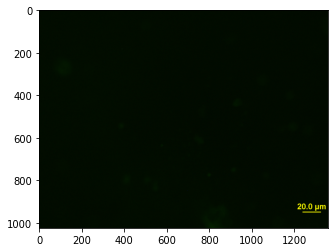

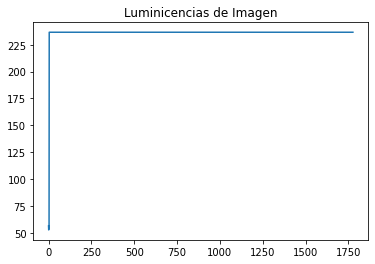

% de Luminicencia: 6.049732881433823
Max 236.58899999999997
Min 46.0368
Median 56.766
Bins Luminancia: 84251
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 2


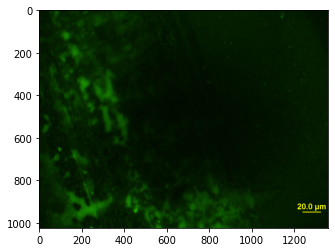

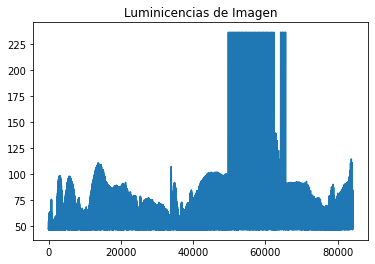

% de Luminicencia: 0.12759937959558823
Max 236.58899999999997
Min 48.519
Median 236.58899999999997
Bins Luminancia: 1777
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 3


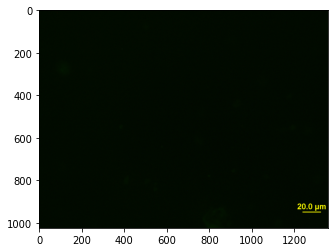

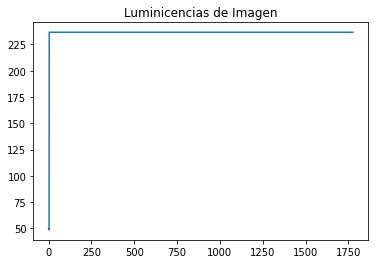

% de Luminicencia: 0.18928079044117646
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 2636
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 4


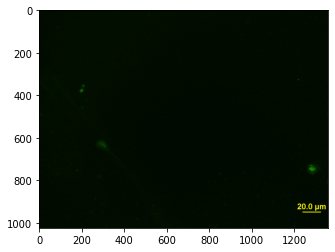

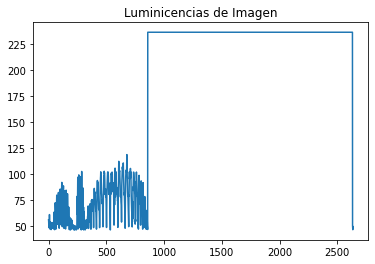

% de Luminicencia: 0.7981962316176471
Max 236.58899999999997
Min 46.0304
Median 62.5406
Bins Luminancia: 11116
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 5


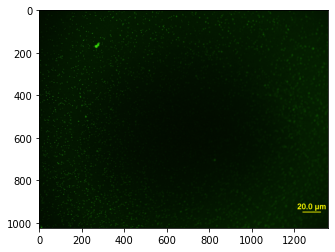

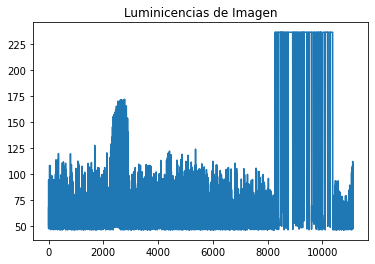

% de Luminicencia: 1.195211971507353
Max 236.58899999999997
Min 46.0304
Median 63.1166
Bins Luminancia: 16645
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 6


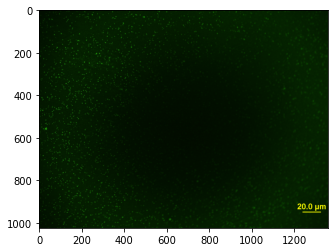

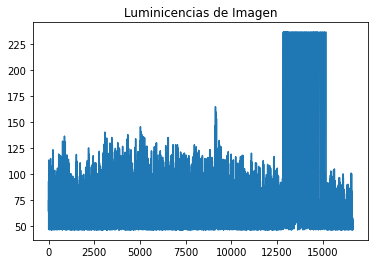

% de Luminicencia: 1.664895450367647
Max 236.58899999999997
Min 46.0432
Median 53.4026
Bins Luminancia: 23186
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 7


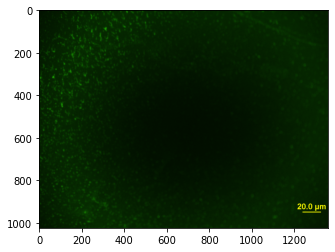

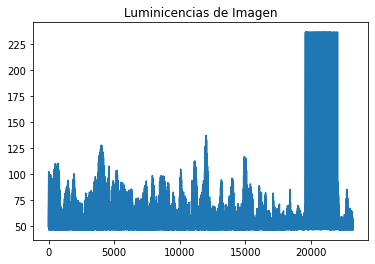

% de Luminicencia: 1.7183191636029411
Max 236.58899999999997
Min 46.0368
Median 52.18999999999999
Bins Luminancia: 23930
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 8


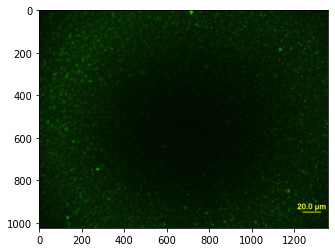

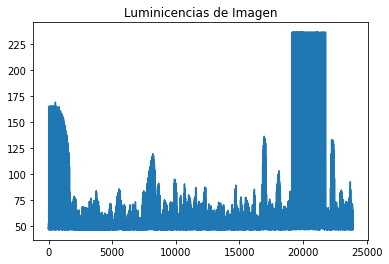

% de Luminicencia: 0.17075482536764705
Max 236.58899999999997
Min 46.0368
Median 236.58899999999997
Bins Luminancia: 2378
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 9


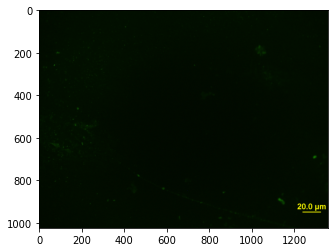

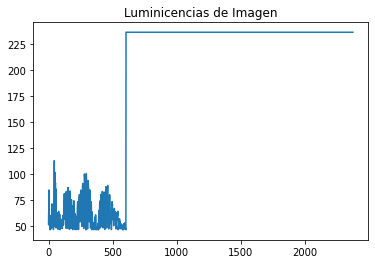

% de Luminicencia: 0.6261488970588235
Max 236.58899999999997
Min 46.035599999999995
Median 64.271
Bins Luminancia: 8720
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 10


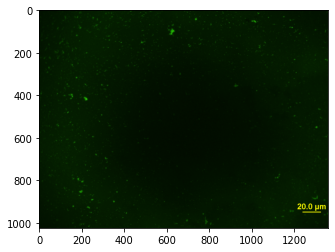

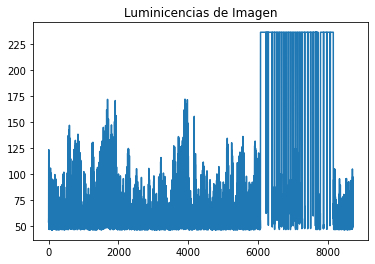

% de Luminicencia: 0.21491555606617646
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 2993
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 11


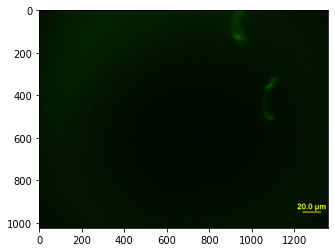

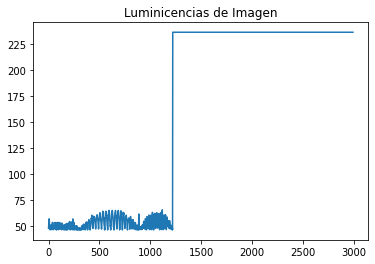

% de Luminicencia: 0.45223460477941174
Max 236.58899999999997
Min 46.0432
Median 96.22279999999999
Bins Luminancia: 6298
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 12


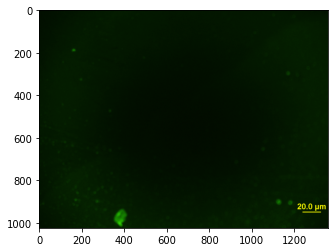

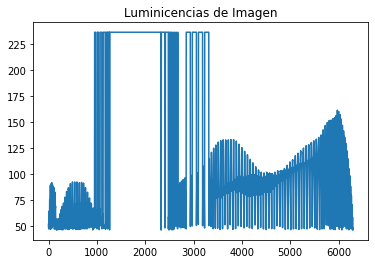

% de Luminicencia: 0.19947725183823528
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 2778
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 13


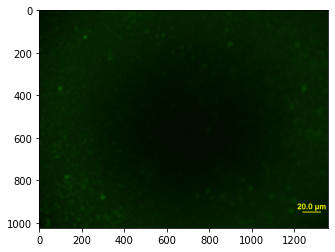

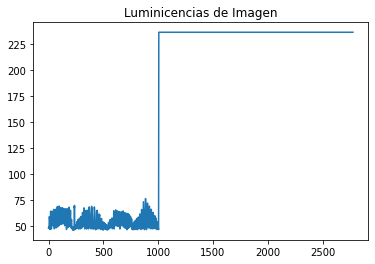

% de Luminicencia: 6.087000229779412
Max 236.58899999999997
Min 46.0368
Median 54.33559999999999
Bins Luminancia: 84770
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 14


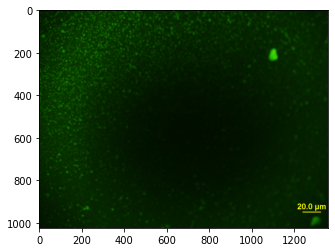

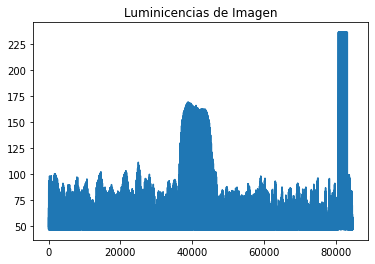

% de Luminicencia: 0.5467313878676471
Max 236.58899999999997
Min 46.0432
Median 73.9938
Bins Luminancia: 7614
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 15


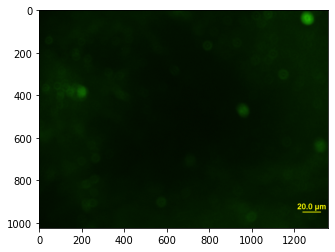

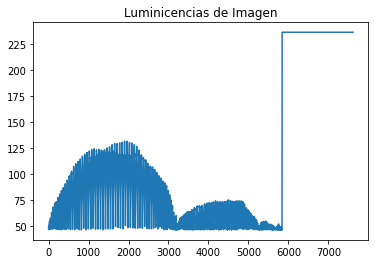

% de Luminicencia: 0.8176556755514706
Max 236.58899999999997
Min 46.035599999999995
Median 68.70139999999999
Bins Luminancia: 11387
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 16


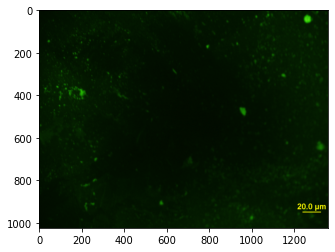

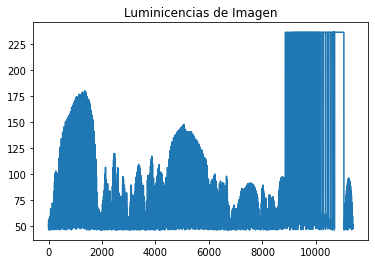

% de Luminicencia: 0.2949075137867647
Max 236.58899999999997
Min 46.0304
Median 84.2128
Bins Luminancia: 4107
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 17


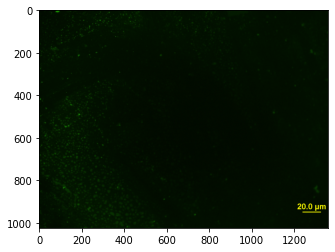

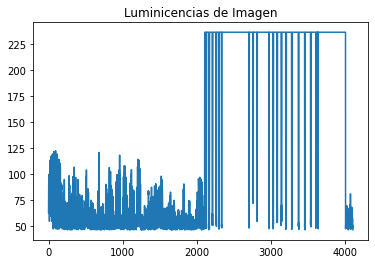

% de Luminicencia: 0.49747242647058826
Max 236.58899999999997
Min 46.0292
Median 118.23919999999998
Bins Luminancia: 6928
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 18


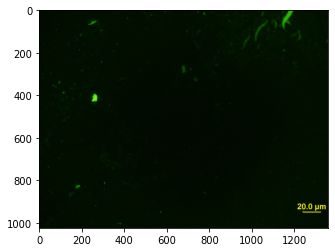

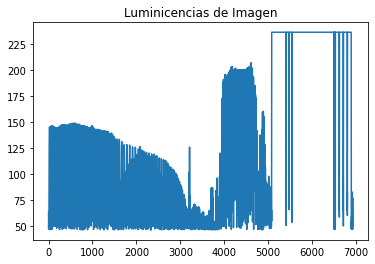

% de Luminicencia: 0.22417853860294118
Max 236.58899999999997
Min 46.0368
Median 236.58899999999997
Bins Luminancia: 3122
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 19


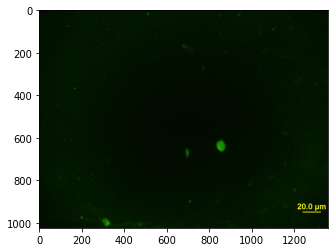

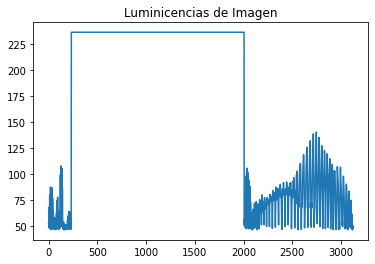

% de Luminicencia: 0.2638154871323529
Max 236.58899999999997
Min 46.0432
Median 132.4568
Bins Luminancia: 3674
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 20


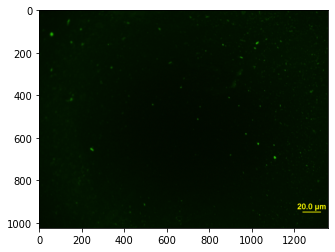

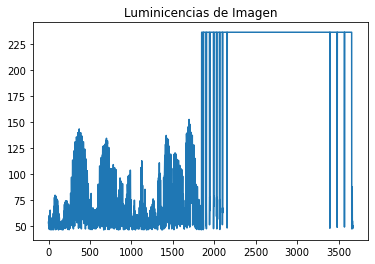

% de Luminicencia: 0.2668313419117647
Max 236.58899999999997
Min 46.0432
Median 129.1746
Bins Luminancia: 3716
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 21


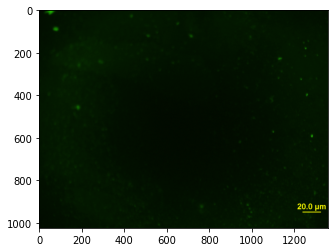

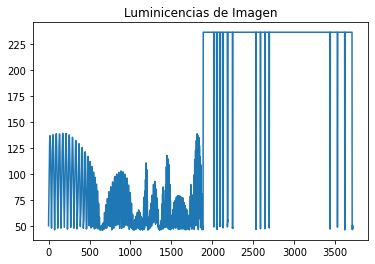

% de Luminicencia: 0.32858455882352944
Max 236.58899999999997
Min 46.0368
Median 106.1197
Bins Luminancia: 4576
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 22


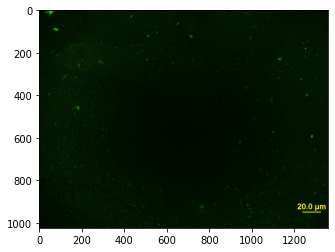

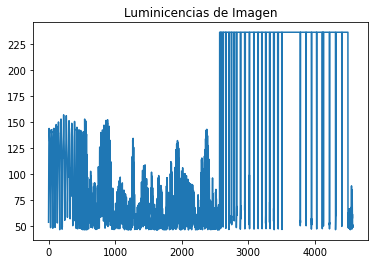

% de Luminicencia: 0.1442583869485294
Max 236.58899999999997
Min 46.0368
Median 236.58899999999997
Bins Luminancia: 2009
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 23


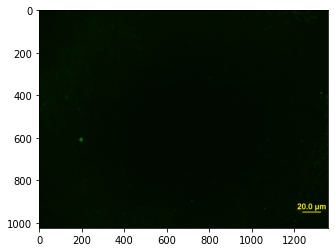

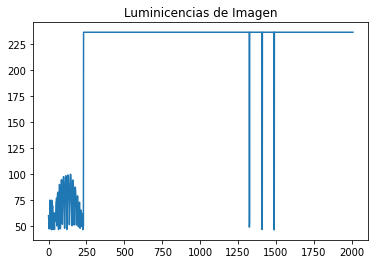

% de Luminicencia: 0.14842313878676472
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 2067
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 24


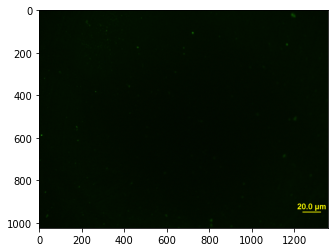

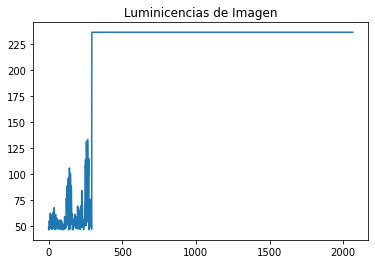

% de Luminicencia: 1.965188419117647
Max 236.58899999999997
Min 46.0432
Median 99.36839999999998
Bins Luminancia: 27368
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 25


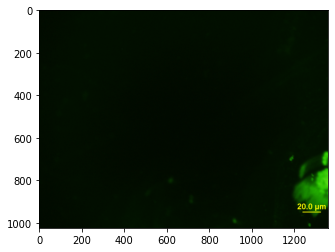

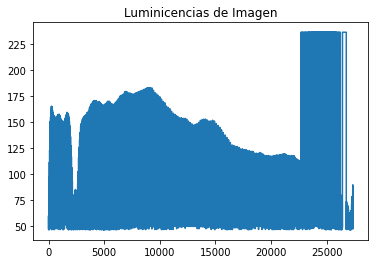

% de Luminicencia: 1.0172047334558822
Max 236.58899999999997
Min 46.035599999999995
Median 59.4026
Bins Luminancia: 14166
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 26


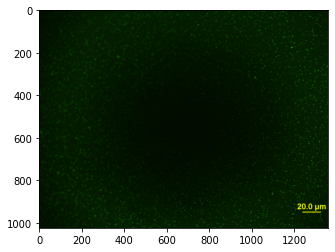

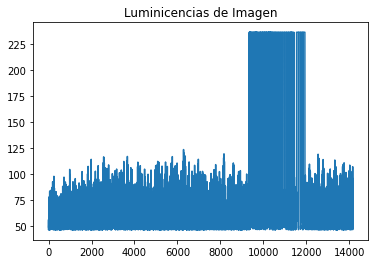

% de Luminicencia: 0.6484805836397058
Max 236.58899999999997
Min 46.0368
Median 191.19119999999998
Bins Luminancia: 9031
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 27


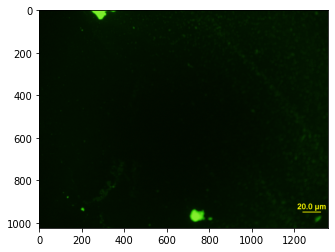

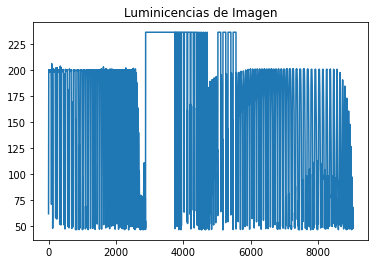

% de Luminicencia: 0.7842658547794118
Max 236.58899999999997
Min 46.0292
Median 170.0074
Bins Luminancia: 10922
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 28


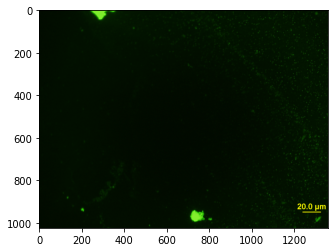

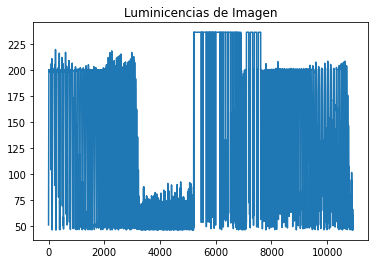

% de Luminicencia: 2.024356617647059
Max 236.58899999999997
Min 46.0292
Median 58.04439999999999
Bins Luminancia: 28192
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 29


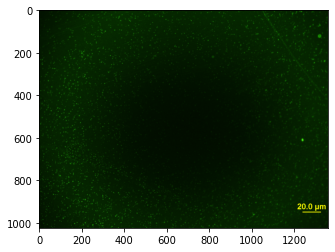

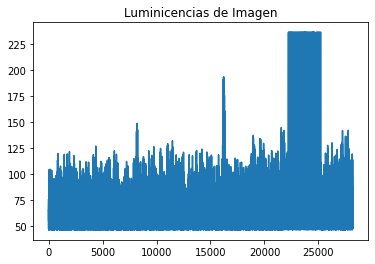

% de Luminicencia: 0.3846650965073529
Max 236.58899999999997
Min 46.0304
Median 59.9646
Bins Luminancia: 5357
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 30


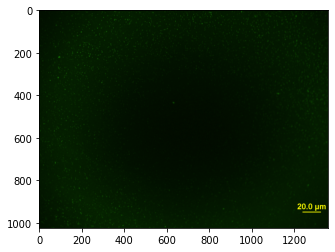

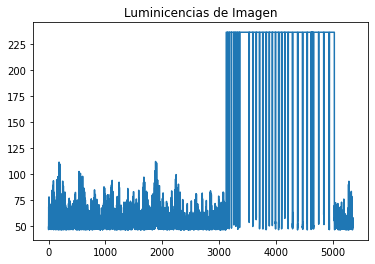

% de Luminicencia: 0.28205422794117646
Max 236.58899999999997
Min 46.0432
Median 150.53239999999997
Bins Luminancia: 3928
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 31


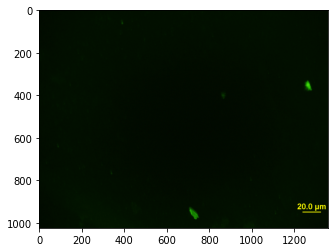

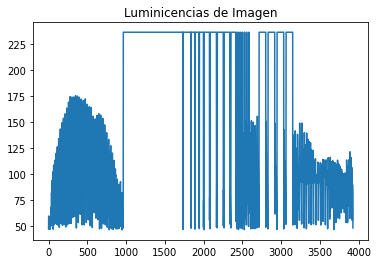

% de Luminicencia: 0.4348575367647059
Max 236.58899999999997
Min 46.0432
Median 168.94439999999997
Bins Luminancia: 6056
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 32


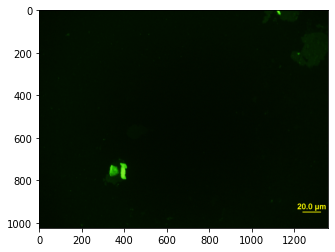

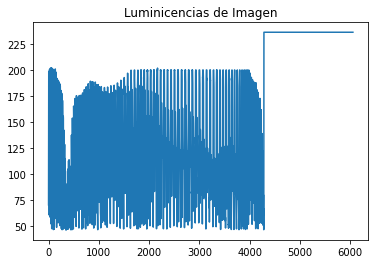

% de Luminicencia: 0.12925091911764705
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 1800
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 33


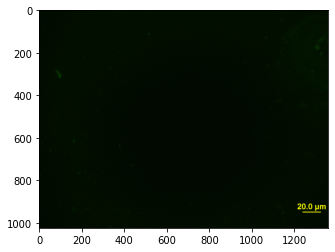

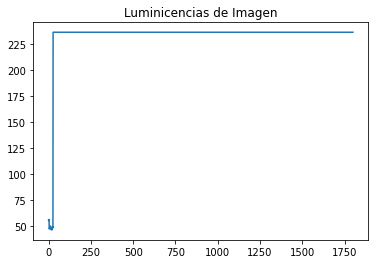

% de Luminicencia: 0.26970358455882354
Max 236.58899999999997
Min 46.0432
Median 127.70809999999999
Bins Luminancia: 3756
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 34


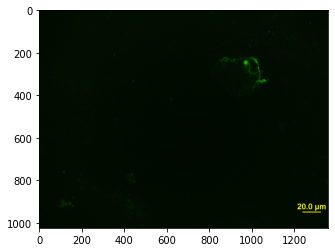

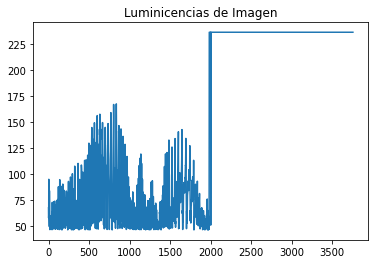

% de Luminicencia: 0.13600068933823528
Max 236.58899999999997
Min 46.2558
Median 236.58899999999997
Bins Luminancia: 1894
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 35


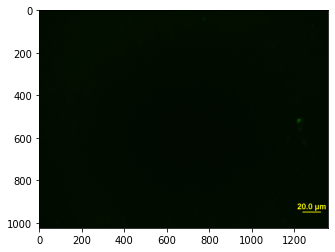

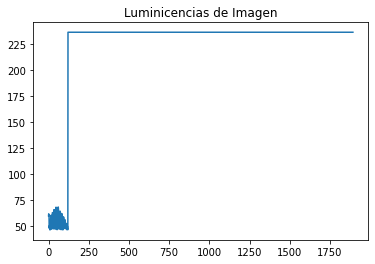

% de Luminicencia: 0.13585707720588236
Max 236.58899999999997
Min 46.11019999999999
Median 236.58899999999997
Bins Luminancia: 1892
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 36


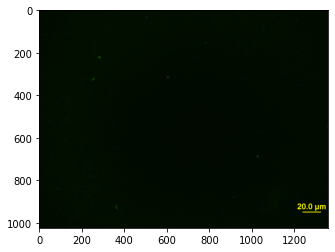

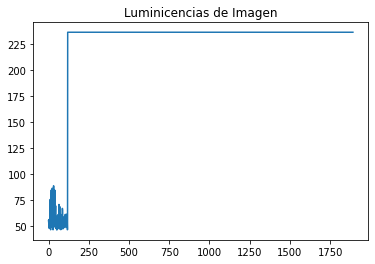

% de Luminicencia: 0.19301470588235295
Max 236.58899999999997
Min 46.0368
Median 236.58899999999997
Bins Luminancia: 2688
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 37


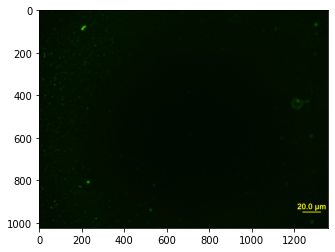

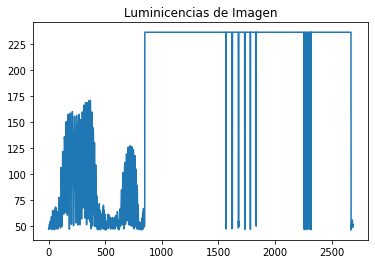

% de Luminicencia: 1.3088809742647058
Max 236.58899999999997
Min 46.0304
Median 56.33559999999999
Bins Luminancia: 18228
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 38


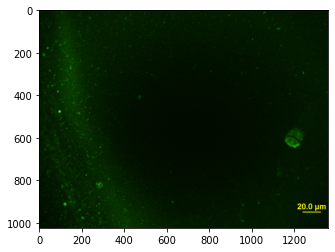

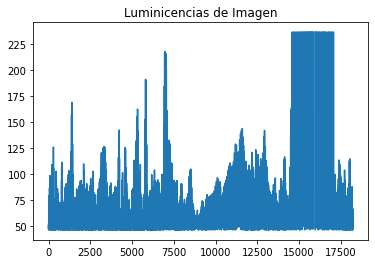

% de Luminicencia: 3.5428394990808822
Max 236.58899999999997
Min 46.0368
Median 58.6926
Bins Luminancia: 49339
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 39


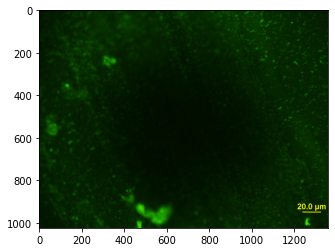

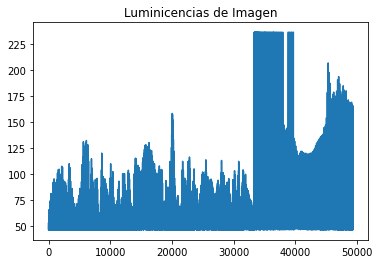

% de Luminicencia: 2.6384420955882355
Max 236.58899999999997
Min 46.0368
Median 61.2698
Bins Luminancia: 36744
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 40


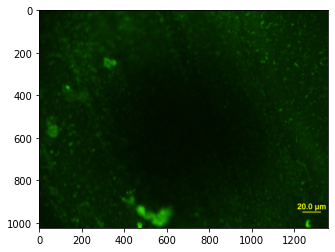

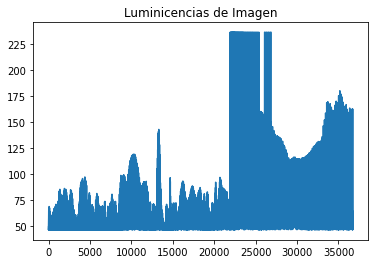

% de Luminicencia: 0.8060948988970589
Max 236.58899999999997
Min 46.0368
Median 53.6204
Bins Luminancia: 11226
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 41


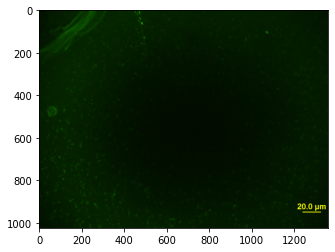

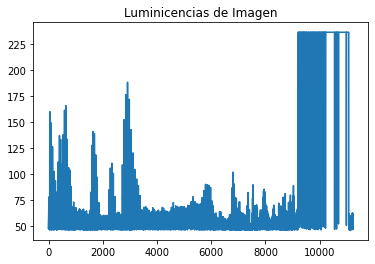

% de Luminicencia: 0.14971564797794118
Max 236.58899999999997
Min 46.0292
Median 236.58899999999997
Bins Luminancia: 2085
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 42


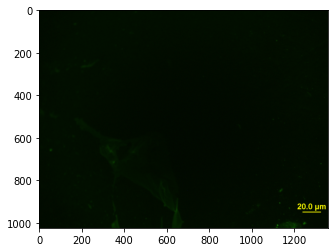

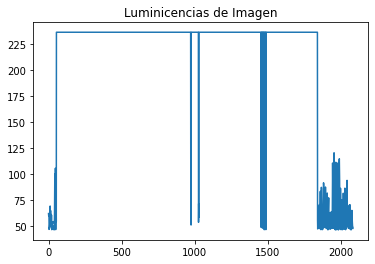

% de Luminicencia: 0.2720731847426471
Max 236.58899999999997
Min 46.0432
Median 141.3186
Bins Luminancia: 3789
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 43


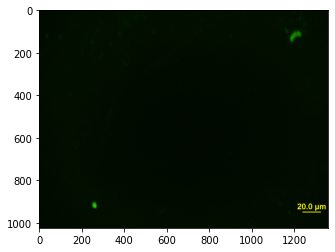

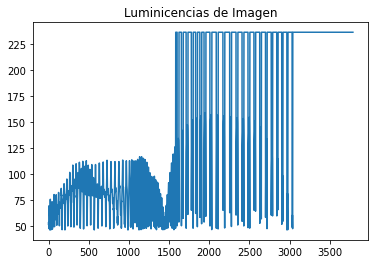

% de Luminicencia: 0.22216796875
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 3094
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 44


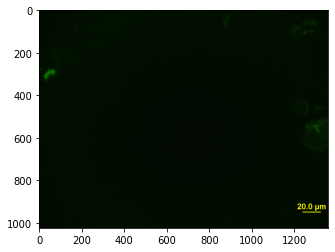

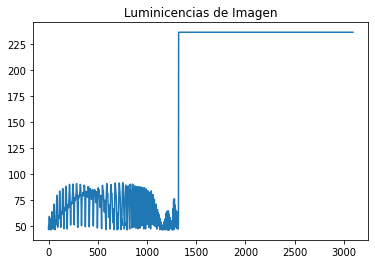

% de Luminicencia: 0.13679055606617646
Max 236.58899999999997
Min 46.2558
Median 236.58899999999997
Bins Luminancia: 1905
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 45


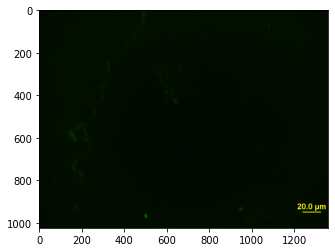

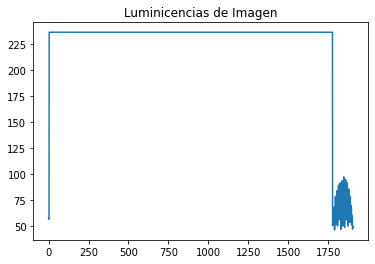

% de Luminicencia: 0.1369341681985294
Max 236.58899999999997
Min 46.182399999999994
Median 236.58899999999997
Bins Luminancia: 1907
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 46


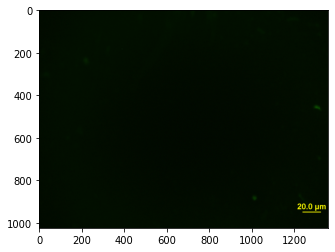

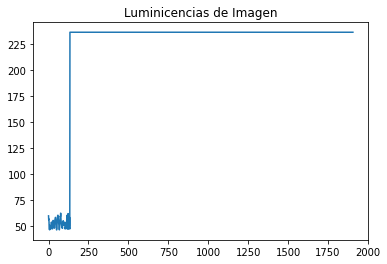

% de Luminicencia: 0.16149184283088236
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 2249
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 47


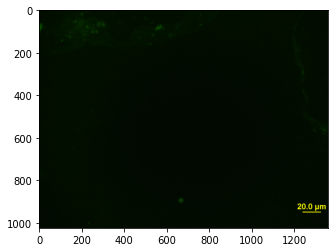

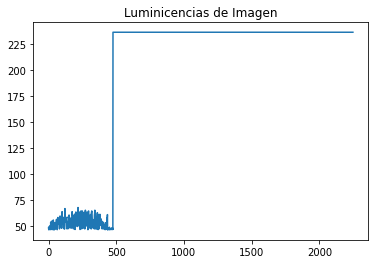

% de Luminicencia: 0.8968577665441176
Max 236.58899999999997
Min 46.0432
Median 79.0724
Bins Luminancia: 12490
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 48


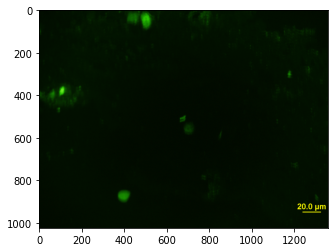

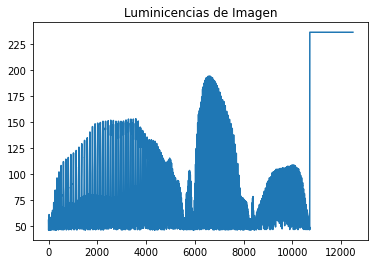

% de Luminicencia: 0.14433019301470587
Max 236.58899999999997
Min 46.11019999999999
Median 236.58899999999997
Bins Luminancia: 2010
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 49


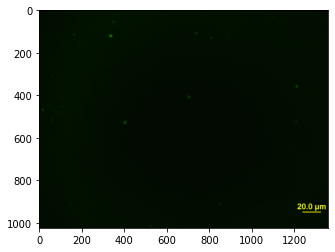

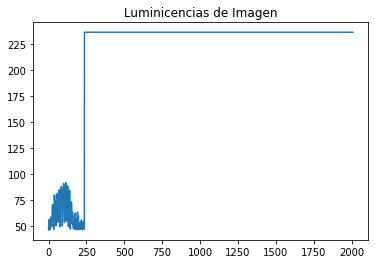

% de Luminicencia: 0.5646110983455882
Max 236.58899999999997
Min 46.035599999999995
Median 59.825399999999995
Bins Luminancia: 7863
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 50


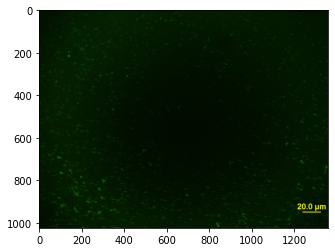

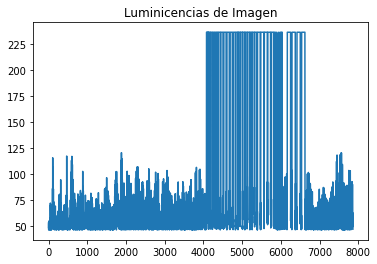

% de Luminicencia: 0.4957490808823529
Max 236.58899999999997
Min 46.0368
Median 72.0983
Bins Luminancia: 6904
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 51


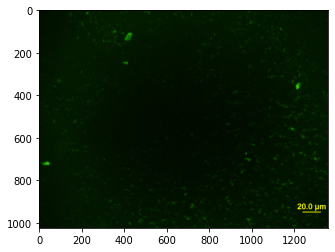

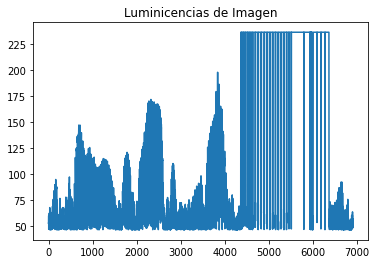

% de Luminicencia: 29.960865693933822
Max 236.58899999999997
Min 46.035599999999995
Median 62.48239999999999
Bins Luminancia: 417247
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 52


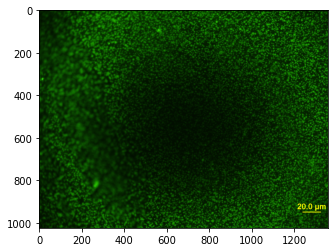

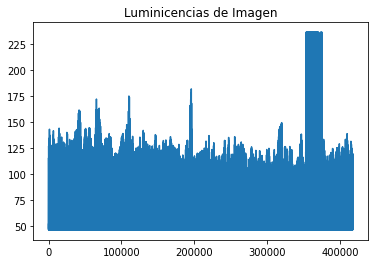

% de Luminicencia: 30.10986328125
Max 236.58899999999997
Min 46.0292
Median 57.409
Bins Luminancia: 419322
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 53


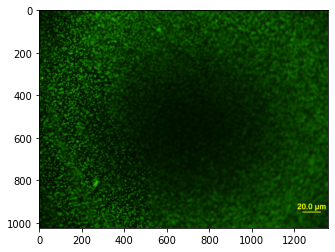

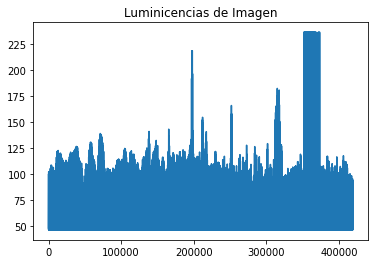

% de Luminicencia: 17.429630055147058
Max 236.58899999999997
Min 46.0304
Median 61.2698
Bins Luminancia: 242732
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 54


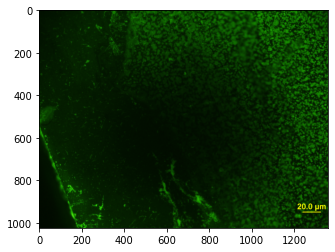

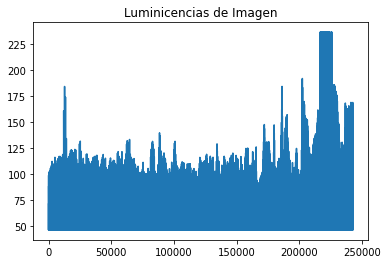

% de Luminicencia: 16.633947035845587
Max 236.58899999999997
Min 46.0368
Median 58.409
Bins Luminancia: 231651
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 55


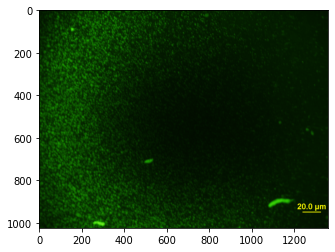

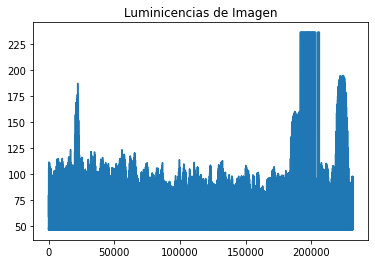

% de Luminicencia: 0.42444565716911764
Max 236.58899999999997
Min 46.035599999999995
Median 76.642
Bins Luminancia: 5911
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 56


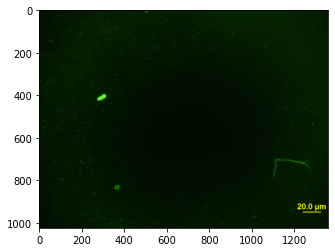

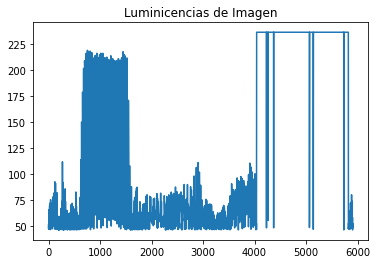

% de Luminicencia: 0.18253102022058823
Max 236.58899999999997
Min 46.0432
Median 236.58899999999997
Bins Luminancia: 2542
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 57


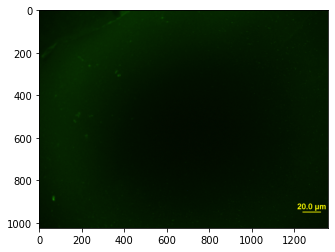

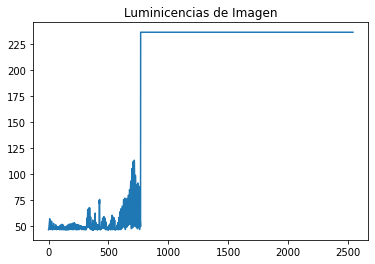

% de Luminicencia: 0.12860466452205882
Max 236.58899999999997
Min 46.2558
Median 236.58899999999997
Bins Luminancia: 1791
Lum >46.025501724137925
filas: 1024 columnas: 1360
Image 58


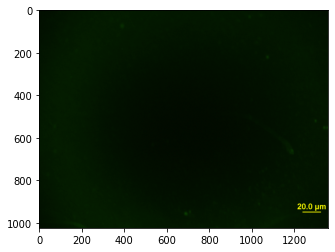

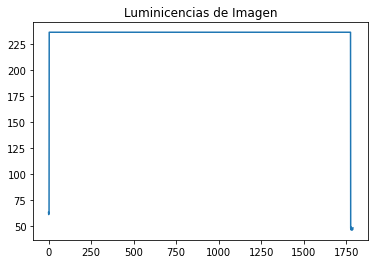

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/7-2 SiO2/Ac+B+S/'
analisis(pathS,'7-2 SiO2 Ac+B+S',1,58) 

# 7-2 Superficie de SiO2 Ac+S

% de Luminicencia: 0.2580710018382353
Max 236.58899999999997
Min 21.523
Median 61.197599999999994
Bins Luminancia: 3594
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 60


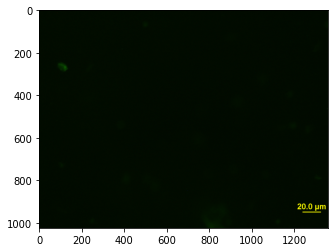

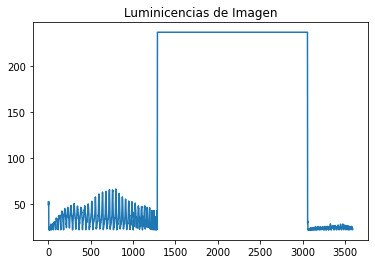

% de Luminicencia: 0.24169921875
Max 236.58899999999997
Min 21.3786
Median 236.58899999999997
Bins Luminancia: 3366
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 61


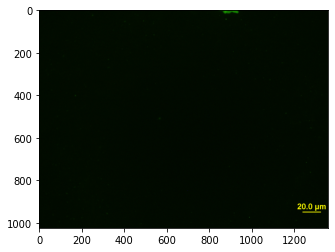

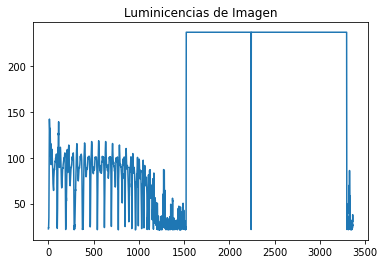

% de Luminicencia: 0.6085564108455882
Max 236.58899999999997
Min 21.4456
Median 27.0228
Bins Luminancia: 8475
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 62


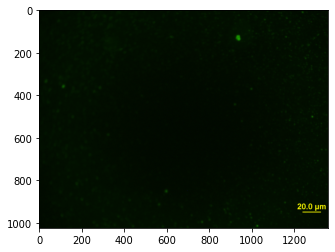

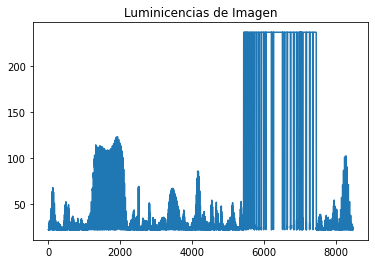

% de Luminicencia: 1.5836109834558822
Max 236.58899999999997
Min 21.4456
Median 24.664599999999997
Bins Luminancia: 22054
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 63


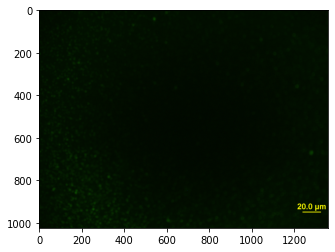

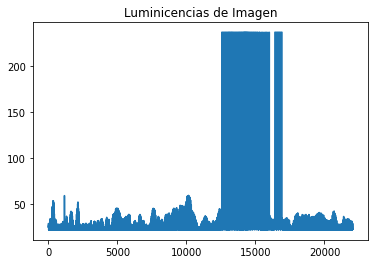

% de Luminicencia: 2.610294117647059
Max 236.58899999999997
Min 21.3786
Median 26.307599999999997
Bins Luminancia: 36352
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 64


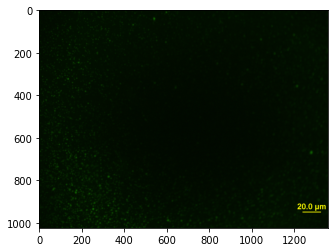

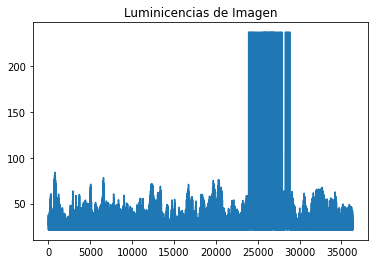

% de Luminicencia: 2.2712258731617645
Max 236.58899999999997
Min 21.3786
Median 55.76599999999999
Bins Luminancia: 31630
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 65


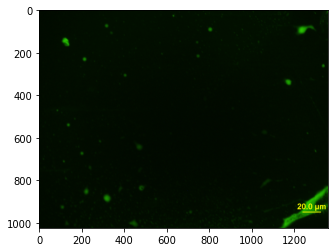

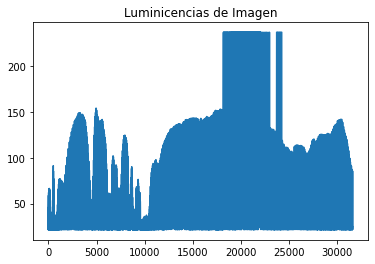

% de Luminicencia: 1.4957203584558822
Max 236.58899999999997
Min 21.3786
Median 34.3874
Bins Luminancia: 20830
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 66


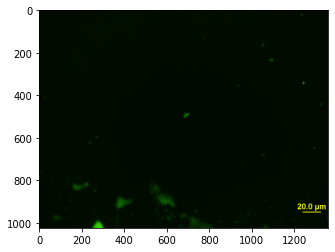

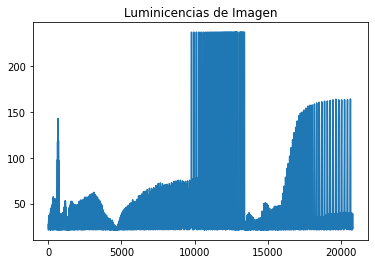

% de Luminicencia: 2.3693129595588234
Max 236.58899999999997
Min 21.3786
Median 23.949399999999997
Bins Luminancia: 32996
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 67


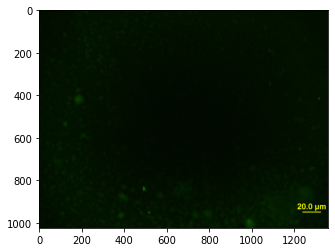

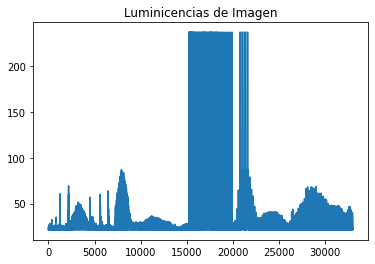

% de Luminicencia: 0.1857622931985294
Max 236.58899999999997
Min 21.523
Median 236.58899999999997
Bins Luminancia: 2587
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 68


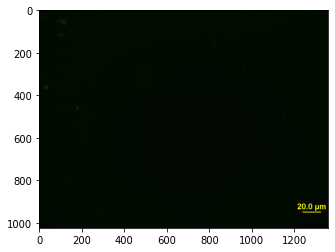

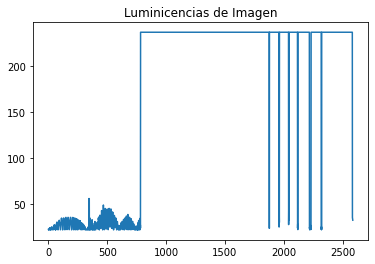

% de Luminicencia: 0.16278435202205882
Max 236.58899999999997
Min 21.3786
Median 236.58899999999997
Bins Luminancia: 2267
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 69


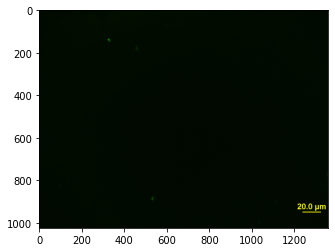

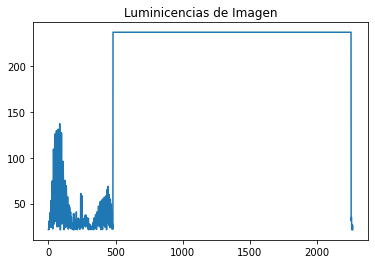

% de Luminicencia: 0.1938763786764706
Max 236.58899999999997
Min 21.523
Median 236.58899999999997
Bins Luminancia: 2700
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 70


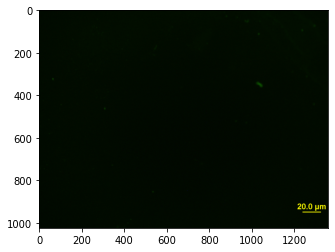

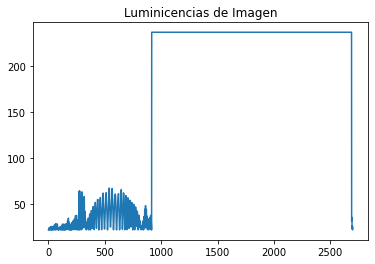

% de Luminicencia: 0.20278033088235295
Max 236.58899999999997
Min 21.3786
Median 236.58899999999997
Bins Luminancia: 2824
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 71


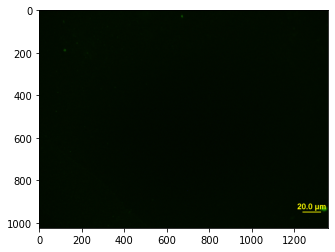

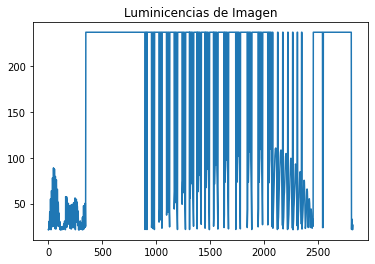

% de Luminicencia: 0.14246323529411764
Max 236.58899999999997
Min 21.4456
Median 236.58899999999997
Bins Luminancia: 1984
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 72


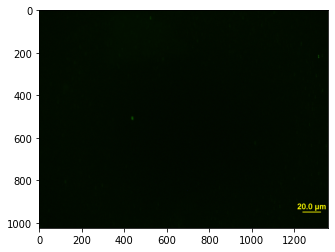

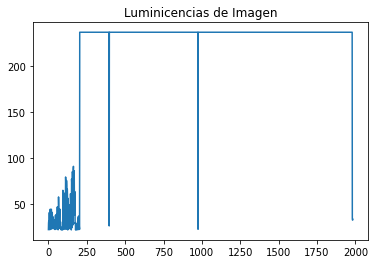

% de Luminicencia: 0.16199448529411764
Max 236.58899999999997
Min 21.456
Median 236.58899999999997
Bins Luminancia: 2256
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 73


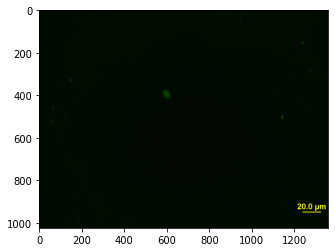

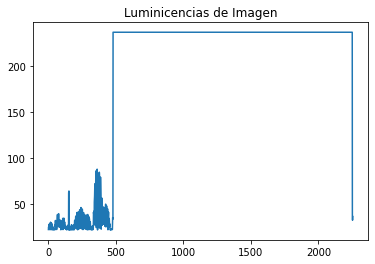

% de Luminicencia: 0.3437356387867647
Max 236.58899999999997
Min 21.3786
Median 131.67319999999998
Bins Luminancia: 4787
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 74


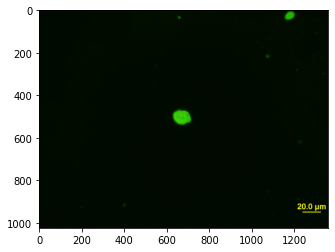

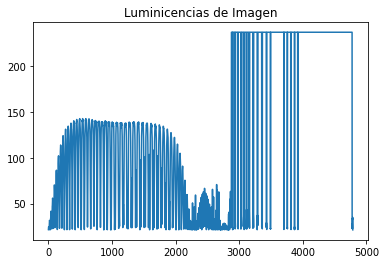

% de Luminicencia: 0.14167336856617646
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 1973
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 75


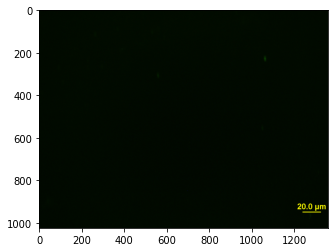

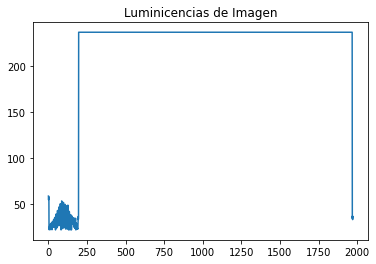

% de Luminicencia: 0.13442095588235295
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 1872
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 76


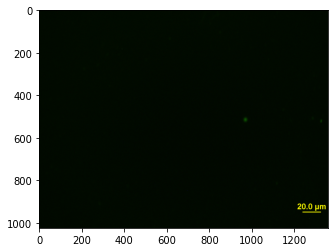

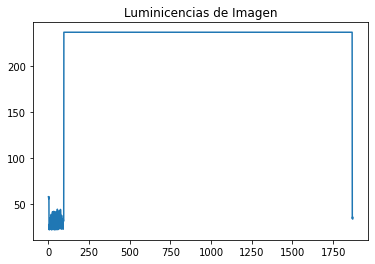

% de Luminicencia: 0.15409581801470587
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 2146
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 77


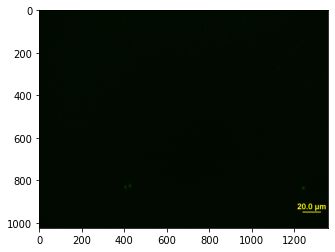

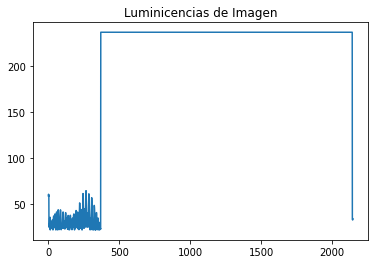

% de Luminicencia: 0.13169232536764705
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 1834
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 78


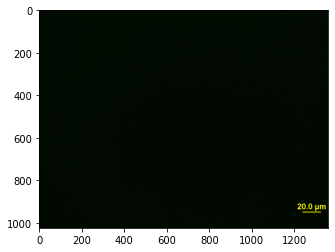

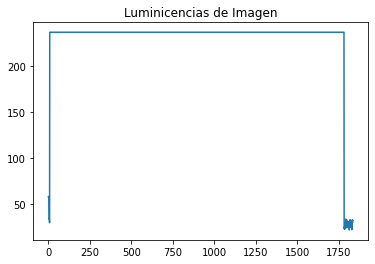

% de Luminicencia: 0.128173828125
Max 236.58899999999997
Min 33.730399999999996
Median 236.58899999999997
Bins Luminancia: 1785
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 79


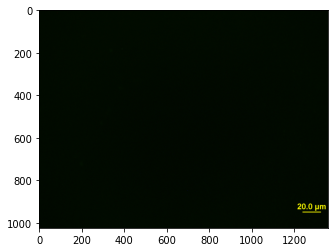

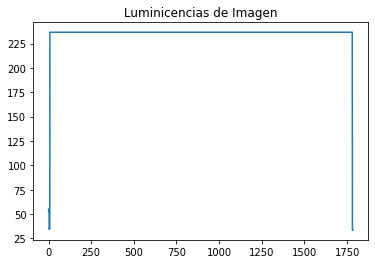

% de Luminicencia: 0.19093232996323528
Max 236.58899999999997
Min 21.444399999999998
Median 236.58899999999997
Bins Luminancia: 2659
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 80


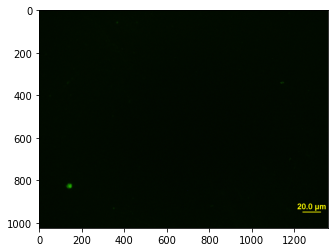

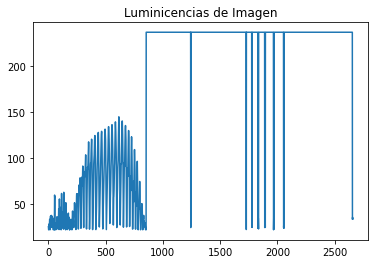

% de Luminicencia: 0.2849264705882353
Max 236.58899999999997
Min 21.5912
Median 116.3062
Bins Luminancia: 3968
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 81


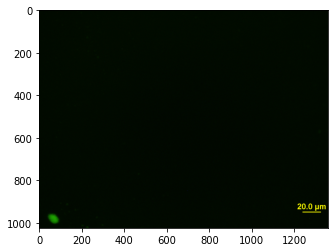

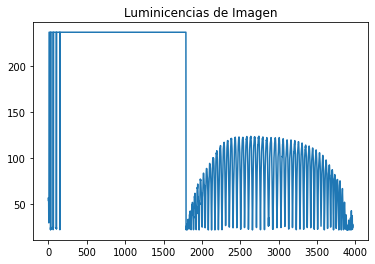

% de Luminicencia: 0.23157456341911764
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 3225
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 82


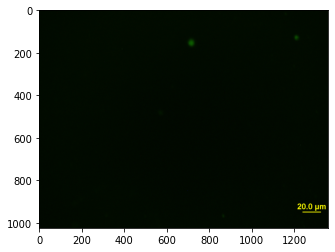

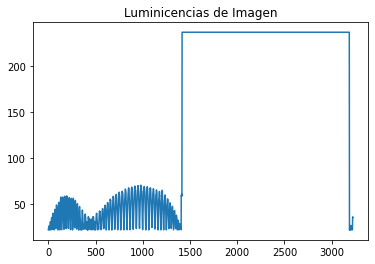

% de Luminicencia: 0.35895852481617646
Max 236.58899999999997
Min 21.450799999999997
Median 50.044399999999996
Bins Luminancia: 4999
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 83


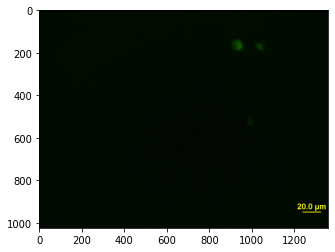

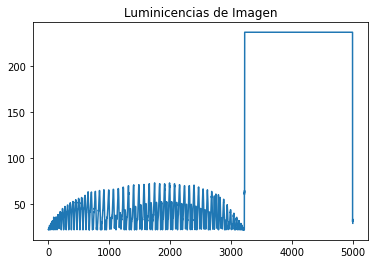

% de Luminicencia: 0.5930463005514706
Max 236.58899999999997
Min 21.4456
Median 26.379799999999996
Bins Luminancia: 8259
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 84


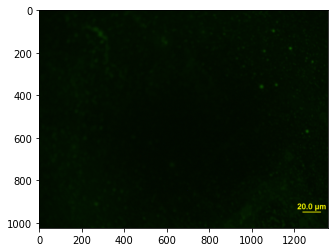

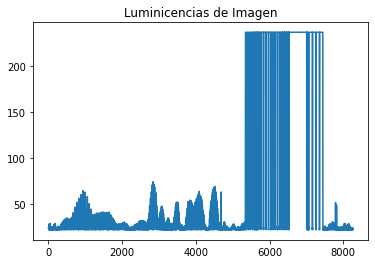

% de Luminicencia: 0.48361385569852944
Max 236.58899999999997
Min 21.4456
Median 62.628
Bins Luminancia: 6735
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 85


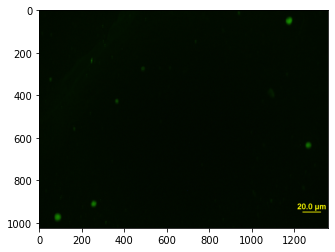

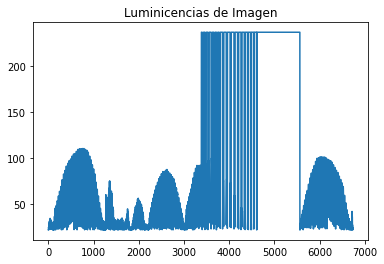

% de Luminicencia: 0.2754480698529412
Max 236.58899999999997
Min 21.377399999999994
Median 65.05839999999999
Bins Luminancia: 3836
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 86


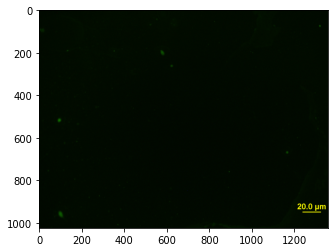

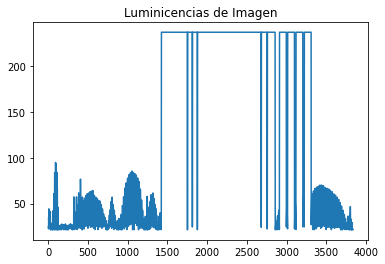

% de Luminicencia: 1.284323299632353
Max 236.58899999999997
Min 21.450799999999997
Median 58.3368
Bins Luminancia: 17886
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 87


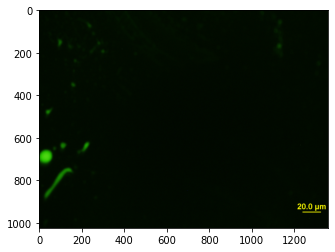

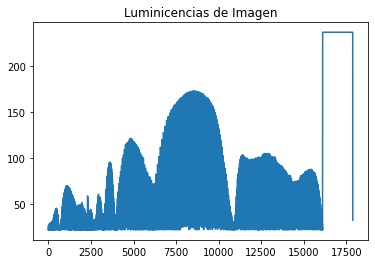

% de Luminicencia: 0.9701717601102942
Max 236.58899999999997
Min 21.523
Median 43.8976
Bins Luminancia: 13511
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 88


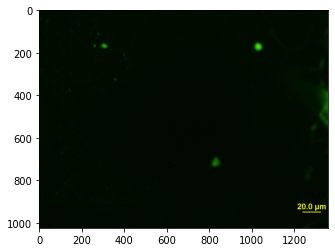

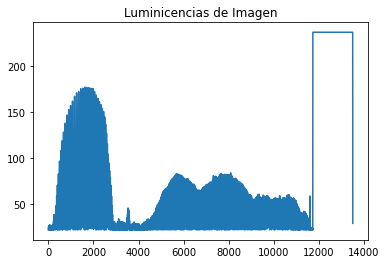

% de Luminicencia: 0.19595875459558823
Max 236.58899999999997
Min 21.450799999999997
Median 236.58899999999997
Bins Luminancia: 2729
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 89


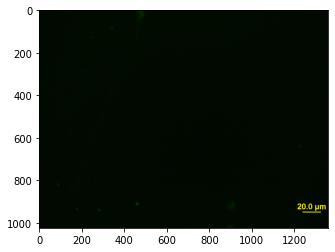

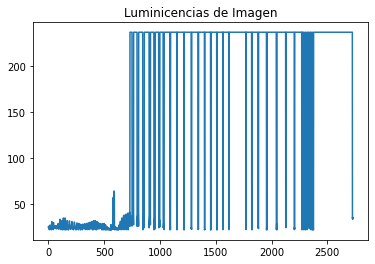

% de Luminicencia: 0.2036420036764706
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 2836
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 90


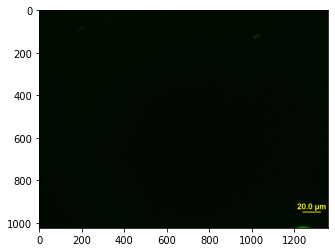

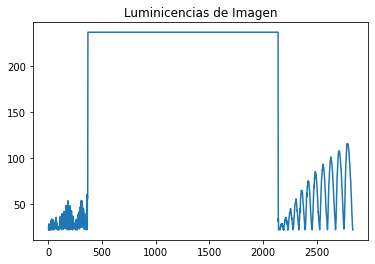

% de Luminicencia: 0.17125746783088236
Max 236.58899999999997
Min 21.3786
Median 236.58899999999997
Bins Luminancia: 2385
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 91


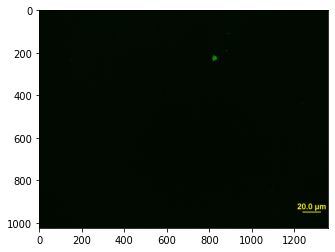

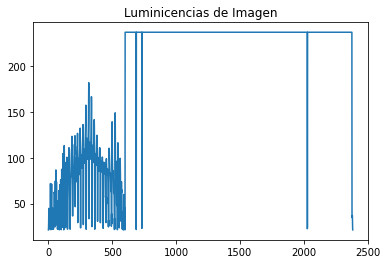

% de Luminicencia: 0.29167624080882354
Max 236.58899999999997
Min 21.3786
Median 47.077299999999994
Bins Luminancia: 4062
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 92


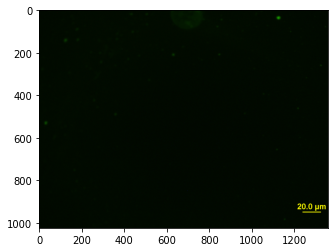

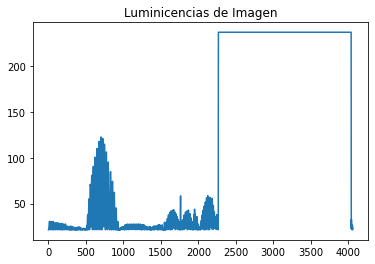

% de Luminicencia: 0.6316061580882353
Max 236.58899999999997
Min 21.444399999999998
Median 27.738
Bins Luminancia: 8796
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 93


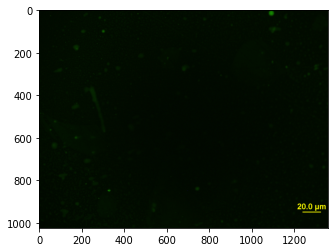

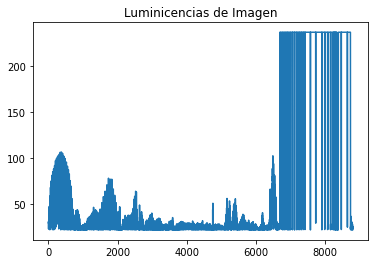

% de Luminicencia: 0.128173828125
Max 236.58899999999997
Min 34.8026
Median 236.58899999999997
Bins Luminancia: 1785
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 94


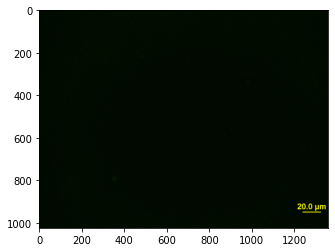

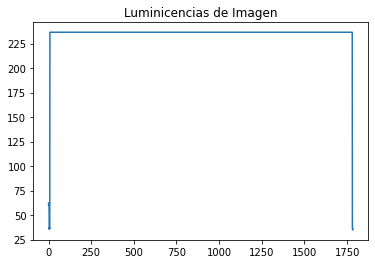

% de Luminicencia: 0.128173828125
Max 236.58899999999997
Min 33.087399999999995
Median 236.58899999999997
Bins Luminancia: 1785
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 95


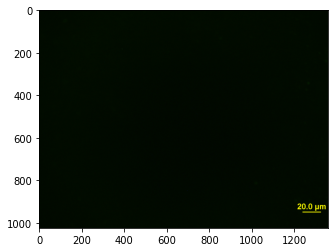

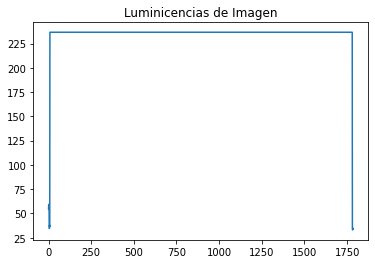

% de Luminicencia: 0.12932272518382354
Max 236.58899999999997
Min 21.8038
Median 236.58899999999997
Bins Luminancia: 1801
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 96


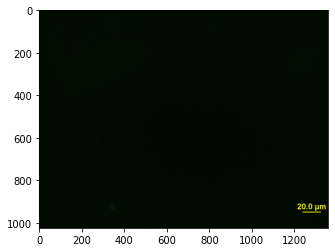

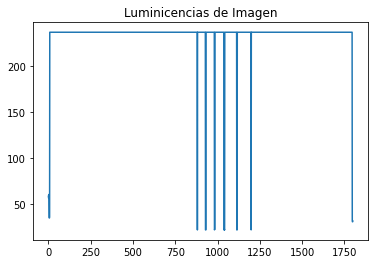

% de Luminicencia: 0.1955279181985294
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 2723
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 97


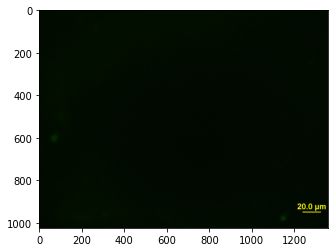

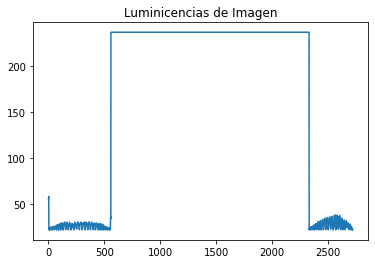

% de Luminicencia: 0.36068187040441174
Max 236.58899999999997
Min 21.450799999999997
Median 56.191199999999995
Bins Luminancia: 5023
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 98


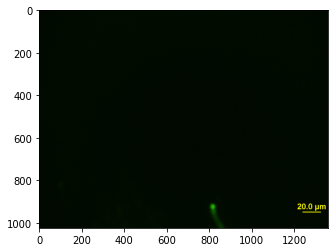

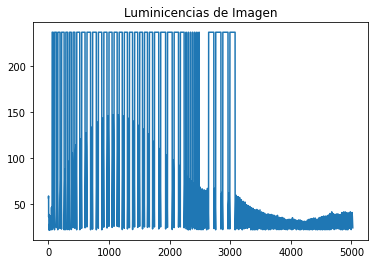

% de Luminicencia: 0.22633272058823528
Max 236.58899999999997
Min 21.377399999999994
Median 236.58899999999997
Bins Luminancia: 3152
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 99


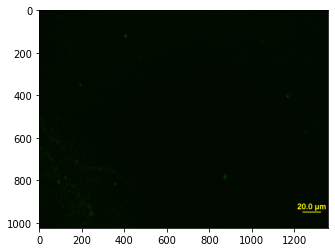

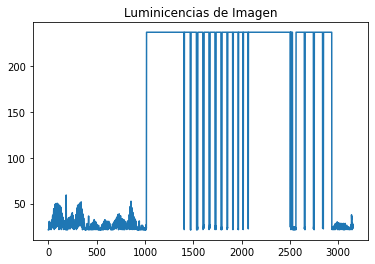

% de Luminicencia: 0.25735294117647056
Max 236.58899999999997
Min 21.450799999999997
Median 70.09629999999999
Bins Luminancia: 3584
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 100


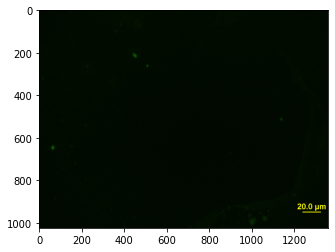

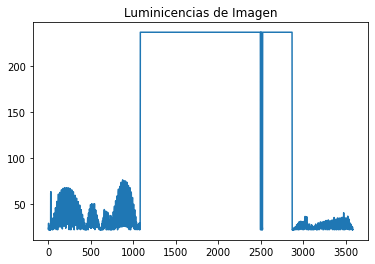

% de Luminicencia: 0.5844295726102942
Max 236.58899999999997
Min 21.3786
Median 56.693799999999996
Bins Luminancia: 8139
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 101


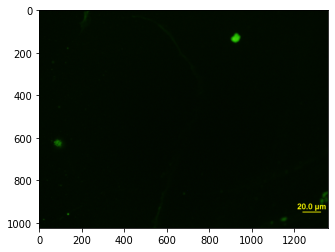

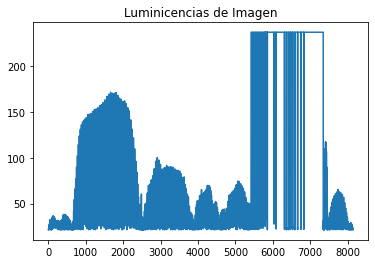

% de Luminicencia: 0.128173828125
Max 236.58899999999997
Min 33.087399999999995
Median 236.58899999999997
Bins Luminancia: 1785
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 102


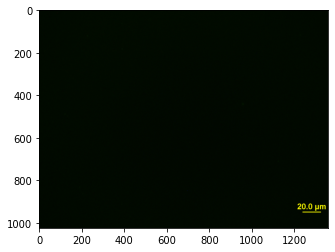

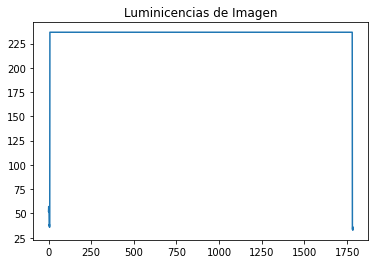

% de Luminicencia: 0.16687729779411764
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 2324
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 103


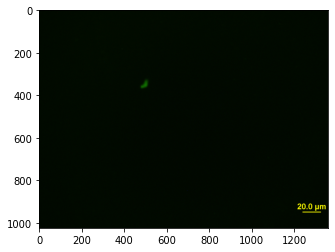

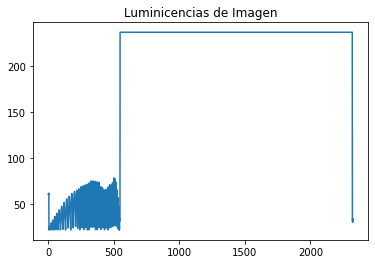

% de Luminicencia: 0.128173828125
Max 236.58899999999997
Min 33.3722
Median 236.58899999999997
Bins Luminancia: 1785
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 104


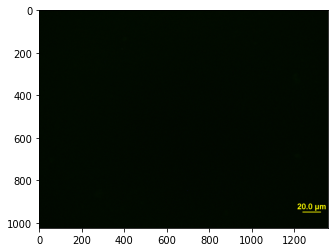

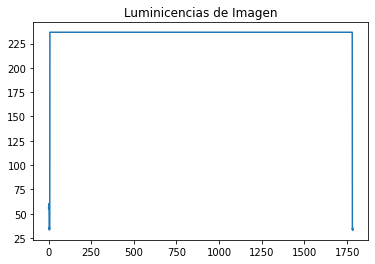

% de Luminicencia: 0.13363108915441177
Max 236.58899999999997
Min 21.4456
Median 236.58899999999997
Bins Luminancia: 1861
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 105


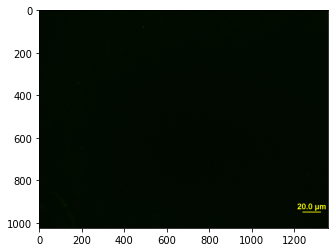

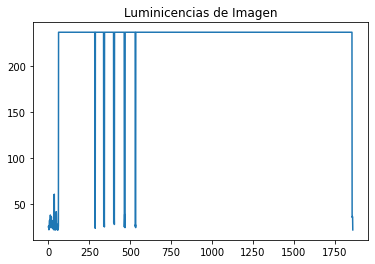

% de Luminicencia: 0.12910730698529413
Max 236.58899999999997
Min 21.875999999999998
Median 236.58899999999997
Bins Luminancia: 1798
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 106


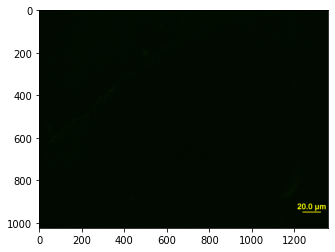

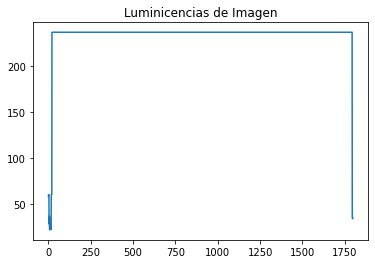

% de Luminicencia: 0.36068187040441174
Max 236.58899999999997
Min 21.3786
Median 55.76599999999999
Bins Luminancia: 5023
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 107


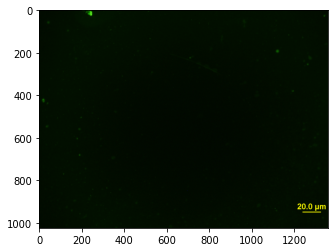

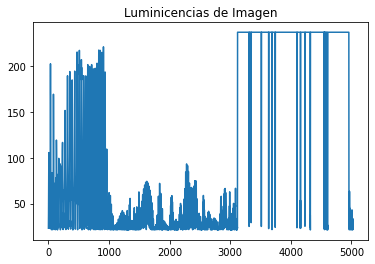

% de Luminicencia: 0.3473977481617647
Max 236.58899999999997
Min 21.3786
Median 74.66909999999999
Bins Luminancia: 4838
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 108


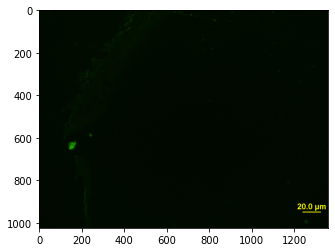

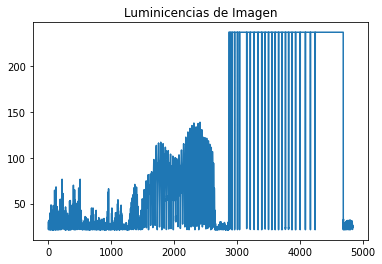

% de Luminicencia: 0.24370978860294118
Max 236.58899999999997
Min 21.523
Median 236.58899999999997
Bins Luminancia: 3394
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 109


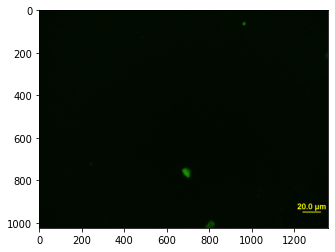

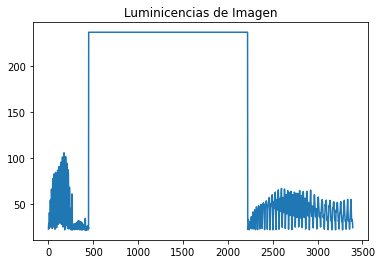

% de Luminicencia: 1.1697208180147058
Max 236.58899999999997
Min 21.3786
Median 26.379799999999996
Bins Luminancia: 16290
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 110


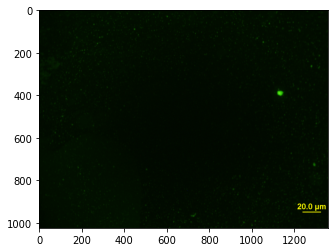

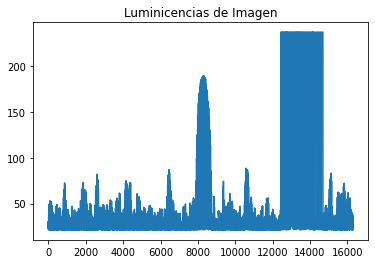

% de Luminicencia: 0.1674517463235294
Max 236.58899999999997
Min 21.3786
Median 236.58899999999997
Bins Luminancia: 2332
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 111


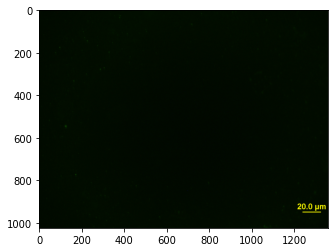

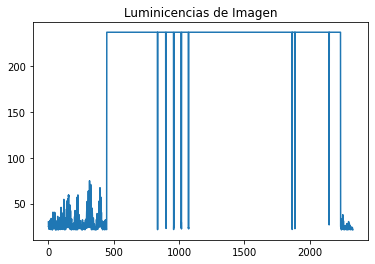

% de Luminicencia: 0.14906939338235295
Max 236.58899999999997
Min 21.517799999999998
Median 236.58899999999997
Bins Luminancia: 2076
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 112


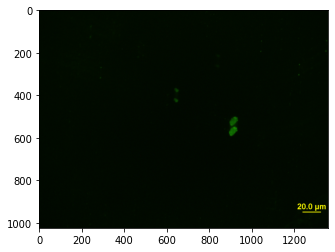

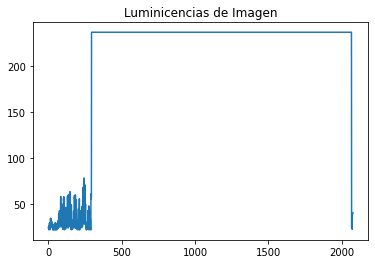

% de Luminicencia: 0.29928768382352944
Max 236.58899999999997
Min 21.3786
Median 64.09449999999998
Bins Luminancia: 4168
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 113


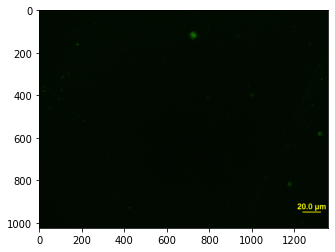

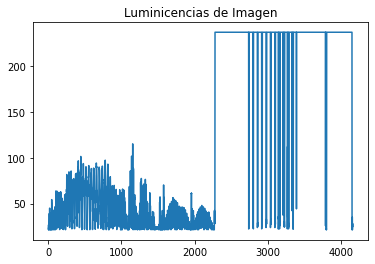

% de Luminicencia: 0.14777688419117646
Max 236.58899999999997
Min 21.5912
Median 236.58899999999997
Bins Luminancia: 2058
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 114


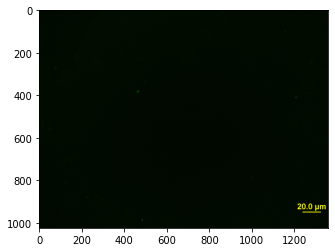

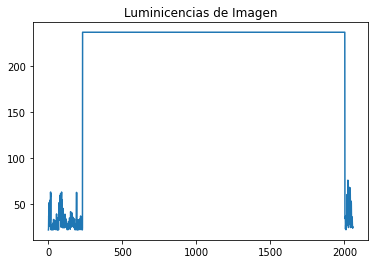

% de Luminicencia: 0.128173828125
Max 236.58899999999997
Min 30.3722
Median 236.58899999999997
Bins Luminancia: 1785
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 115


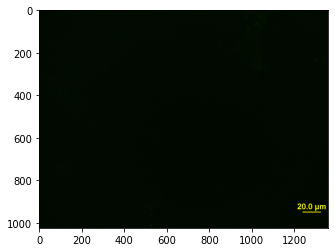

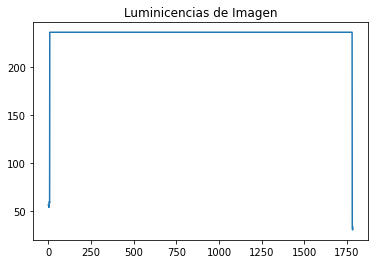

% de Luminicencia: 0.172119140625
Max 236.58899999999997
Min 21.3786
Median 236.58899999999997
Bins Luminancia: 2397
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 116


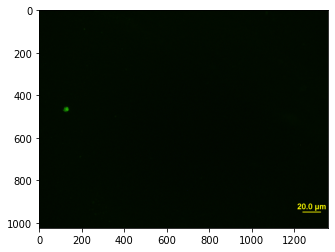

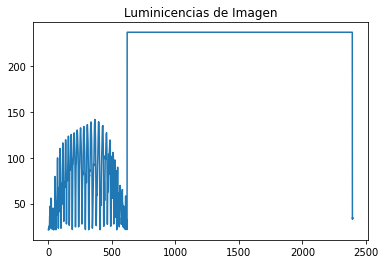

% de Luminicencia: 0.128173828125
Max 236.58899999999997
Min 32.3722
Median 236.58899999999997
Bins Luminancia: 1785
Lum >21.375348275862066
filas: 1024 columnas: 1360
Image 117


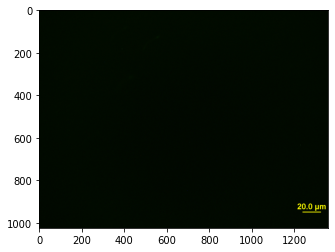

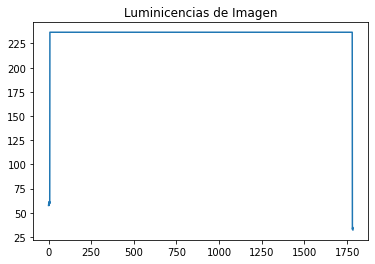

In [ ]:
pathS ='/content/drive/My Drive/CNEA/STREPTAVIDINA/7-2 SiO2/Ac+S/'
analisis(pathS,'7-2 SiO2 Ac+S',60,117) 